In [1]:
# --- Imports ---
import pyreadstat
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import umap
from sklearn.preprocessing import StandardScaler
import math

# --- Config ---
SAV_PATH = "DS0001/04652-0001-Data.sav"
NON_RESPONSE_CODES = [-1, -2, -3, -7, 9999]

# --- Variables of Interest ---
midus_vars = {
    # "M2ID": "MIDUS 2 ID number",  # Uncomment if needed for merging
    "B1PRAGE_2019": "Age",
    "B1PRSEX": "Sex (Male:1, Female:2)",
    "B1PB1": "Education Level",
    "B1PB3A": "Currently Working",
    "B1PA1": "Self-rated Physical Health",
    "B1PA2": "Self-rated Mental Health",
    "B1SA11T": "Anxiety/Depression (Past Year)",
    "B1SA11V": "Migraines (Past Year)",
    "B1SA11W": "Chronic Sleep Problems (Past Year)",
    "B1SG1": "Financial Situation Rating",
    "B1SG6": "Money Meets Needs",
    "B1SJ1": "Contact with Family",
    "B1SJ2A": "Family Cares About You",
    "B1SJ4A": "Friends Care About You",
    "B1SL1": "Marriage/Relationship Rating",
    "B1SM1": "Sex Life Rating",
    "B1SQ1": "Overall Life Rating",
    "B1PG1": "Satisfied with Life at Present"
}

# --- Load and Clean ---
columns_to_load = list(midus_vars.keys())
df, meta = pyreadstat.read_sav(SAV_PATH, usecols=columns_to_load)

df.replace(NON_RESPONSE_CODES, pd.NA, inplace=True)
df.dropna(inplace=True)
df.rename(columns=midus_vars, inplace=True)

df.head()


,Age,"Sex (Male:1, Female:2)",Self-rated Physical Health,Self-rated Mental Health,Education Level,Currently Working,Satisfied with Life at Present,Anxiety/Depression (Past Year),Migraines (Past Year),Chronic Sleep Problems (Past Year),Financial Situation Rating,Money Meets Needs,Contact with Family,Family Cares About You,Friends Care About You,Marriage/Relationship Rating,Sex Life Rating,Overall Life Rating
1,69.0,1.0,1.0,1.0,12.0,1.0,1.0,2.0,2.0,2.0,9.0,1.0,3.0,1.0,2.0,8.0,7.0,9.0
4,55.0,1.0,2.0,3.0,5.0,1.0,2.0,2.0,2.0,2.0,7.0,3.0,4.0,1.0,1.0,8.0,9.0,8.0
5,52.0,2.0,1.0,2.0,11.0,2.0,2.0,1.0,2.0,2.0,8.0,2.0,3.0,1.0,2.0,1.0,0.0,8.0
7,53.0,2.0,3.0,3.0,5.0,1.0,2.0,2.0,1.0,2.0,4.0,3.0,3.0,1.0,1.0,8.0,0.0,7.0
9,49.0,1.0,2.0,2.0,5.0,1.0,1.0,2.0,2.0,2.0,8.0,2.0,6.0,1.0,2.0,9.0,8.0,8.0


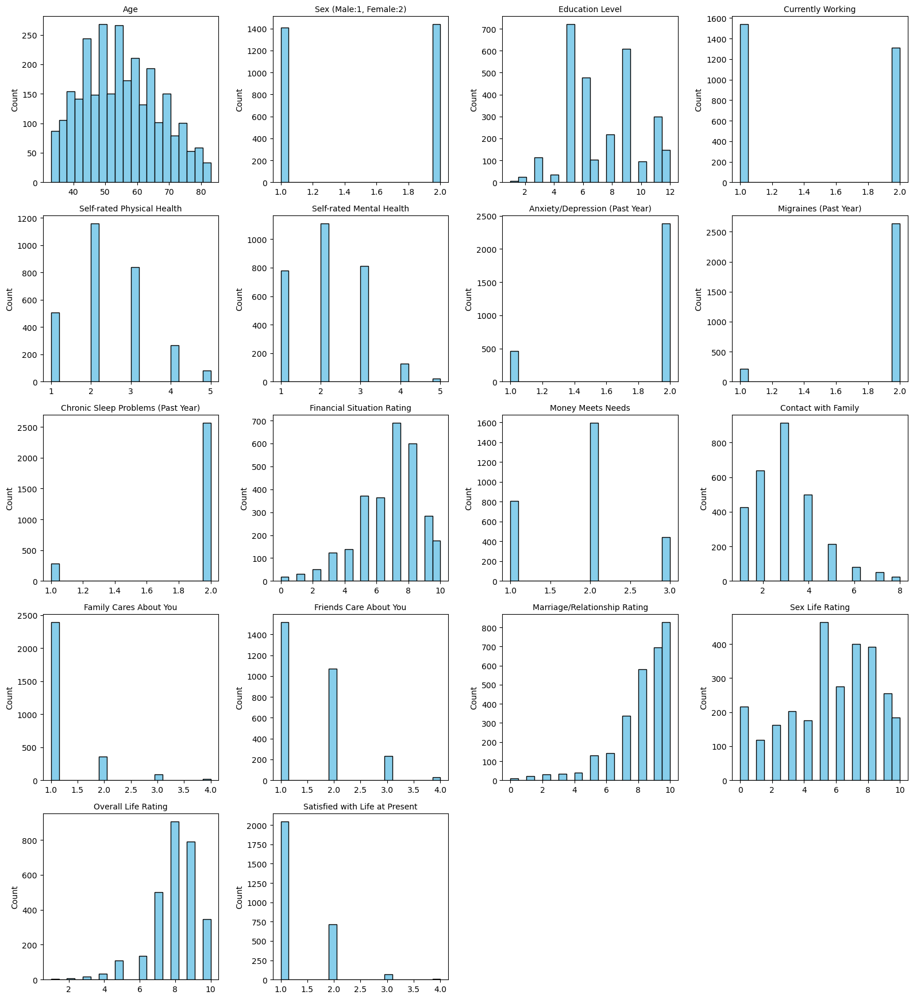

In [3]:
import matplotlib.pyplot as plt

# Plot histograms for each variable in midus_vars
num_vars = len(midus_vars)
ncols = 4
nrows = (num_vars + ncols - 1) // ncols  # ensures enough rows

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(4 * ncols, 3.5 * nrows))
axes = axes.flatten()

for i, var in enumerate(midus_vars):
    ax = axes[i]
    ax.hist(df[midus_vars[var]], bins=20, color='skyblue', edgecolor='black')
    ax.set_title(midus_vars[var], fontsize=10)
    ax.set_xlabel("")  # Optional: var or blank for cleaner layout
    ax.set_ylabel("Count")

# Hide unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


In [5]:
# Rename columns to human-readable descriptions
df.rename(columns=midus_vars, inplace=True)

# Handle special non-response codes
non_response_codes = [-1, -2, -3, -7, 9999]
df_clean = df.replace(non_response_codes, pd.NA).dropna().copy()

# Drop ID columns if they exist (safe even if not present)
features = df_clean.drop(columns=["MIDUS 2 ID number"], errors="ignore")

# Standardize feature values (zero mean, unit variance)
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# UMAP dimensionality reduction
umap_model = umap.UMAP(
    n_neighbors=30,
    min_dist=0.8,
    metric='euclidean',
    random_state=23
)
embedding = umap_model.fit_transform(scaled_data)

# Combine UMAP output with original data for plotting/analysis
df_umapo = pd.DataFrame(embedding, columns=["UMAP1", "UMAP2"])
df_umapo = pd.concat([df_umapo, df_clean.reset_index(drop=True)], axis=1)


/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


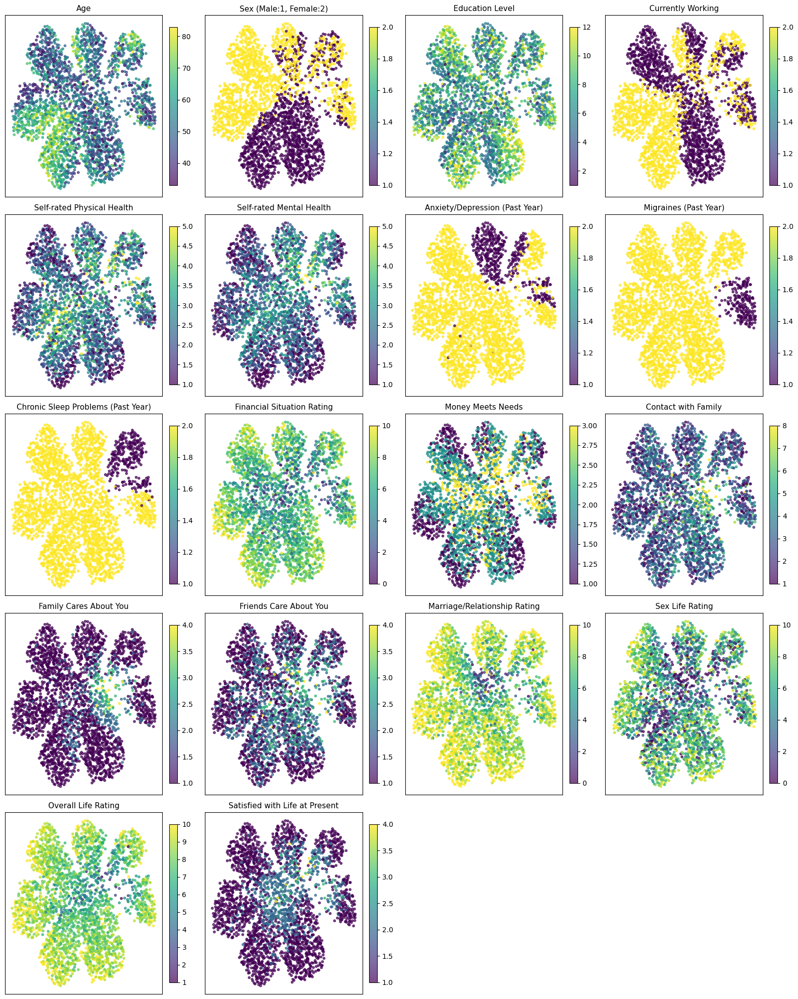

In [7]:
# Plot each variable’s distribution on UMAP projection

# Human-readable variable names (already renamed in df_clean)
variables = list(midus_vars.values())
n_vars = len(variables)

# Grid size for subplots
n_cols = 4
n_rows = math.ceil(n_vars / n_cols)

# Set up figure
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

# Plot each variable on the UMAP plane
for i, var in enumerate(variables):
    ax = axes[i]
    scatter = ax.scatter(
        df_umapo["UMAP1"], df_umapo["UMAP2"], 
        c=df_umapo[var], cmap='viridis', s=10, alpha=0.7
    )
    ax.set_title(var, fontsize=11)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)

# Hide unused axes
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('plots/first.png')


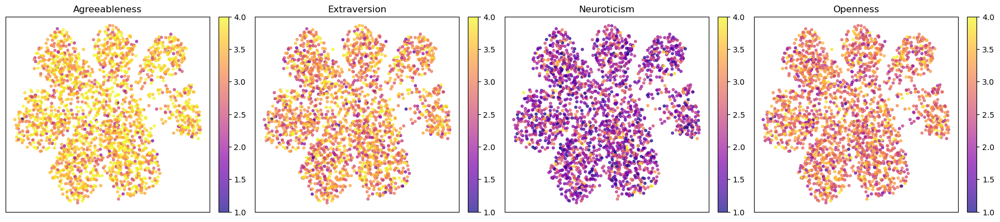

In [39]:
# Define Big Five variable mapping
big5_vars = {
    "B1SAGREE": "Agreeableness",
    "B1SEXTRA": "Extraversion",
    "B1SNEURO": "Neuroticism",
    "B1SCONSC": "Conscientiousness",
    "B1SOPEN": "Openness"
}

# Load full Big Five data
df_big5_raw, _ = pyreadstat.read_sav("DS0001/04652-0001-Data.sav", usecols=list(big5_vars.keys()))
df_big5_raw.replace([-1, -2, -3, -7, 9999], pd.NA, inplace=True)
valid_mask = df_big5_raw.notna().all(axis=1)

# Apply mask to both dataframes
df_big5_clean = df_big5_raw[valid_mask].rename(columns=big5_vars).reset_index(drop=True)
df_umapo_clean = df_umapo.loc[valid_mask].reset_index(drop=True)

# Remove existing Big Five columns from df_umapo if they exist to avoid duplicates
df_umapo_clean = df_umapo_clean.drop(columns=[c for c in big5_vars.values() if c in df_umapo_clean.columns], errors='ignore')

# Combine
df_merged = pd.concat([df_umapo_clean, df_big5_clean], axis=1)

# Updated Big Five columns (only those present)
big5_cols = ["Agreeableness", "Extraversion", "Neuroticism", "Openness"]

# Plot
fig, axes = plt.subplots(1, 4, figsize=(18, 4))
for i, col in enumerate(big5_cols):
    scatter = axes[i].scatter(df_merged["UMAP1"], df_merged["UMAP2"],
                          c=df_merged[col].astype(float), cmap="plasma", s=10, alpha=0.7)
    axes[i].set_title(col)
    axes[i].set_xticks([])
    axes[i].set_yticks([])
    fig.colorbar(scatter, ax=axes[i], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig("plots/bigfive_projection_only.png")

/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


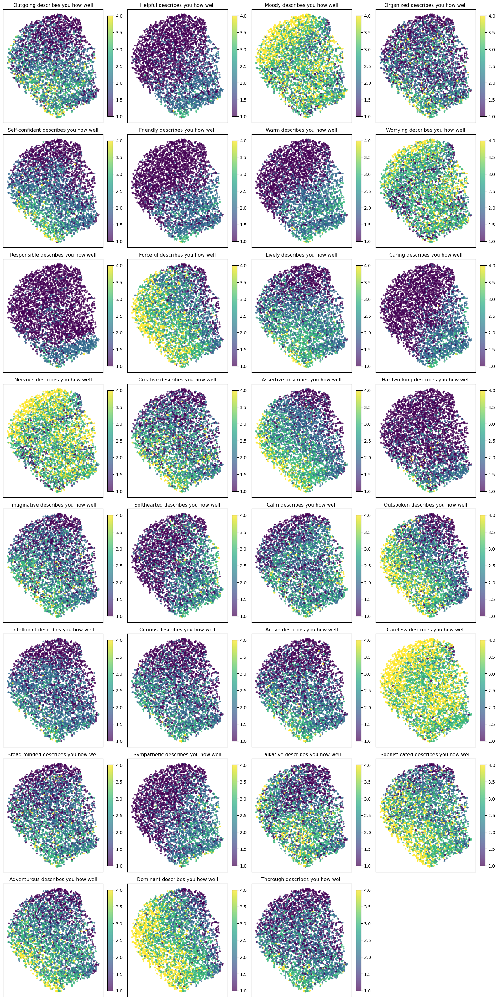

In [34]:
# Dictionary of variable codes and descriptions
personality_vars = {
    "B1SE6A": "Outgoing describes you how well",
    "B1SE6B": "Helpful describes you how well",
    "B1SE6C": "Moody describes you how well",
    "B1SE6D": "Organized describes you how well",
    "B1SE6E": "Self-confident describes you how well",
    "B1SE6F": "Friendly describes you how well",
    "B1SE6G": "Warm describes you how well",
    "B1SE6H": "Worrying describes you how well",
    "B1SE6I": "Responsible describes you how well",
    "B1SE6J": "Forceful describes you how well",
    "B1SE6K": "Lively describes you how well",
    "B1SE6L": "Caring describes you how well",
    "B1SE6M": "Nervous describes you how well",
    "B1SE6N": "Creative describes you how well",
    "B1SE6O": "Assertive describes you how well",
    "B1SE6P": "Hardworking describes you how well",
    "B1SE6Q": "Imaginative describes you how well",
    "B1SE6R": "Softhearted describes you how well",
    "B1SE6S": "Calm describes you how well",
    "B1SE6T": "Outspoken describes you how well",
    "B1SE6U": "Intelligent describes you how well",
    "B1SE6V": "Curious describes you how well",
    "B1SE6W": "Active describes you how well",
    "B1SE6X": "Careless describes you how well",
    "B1SE6Y": "Broad minded describes you how well",
    "B1SE6Z": "Sympathetic describes you how well",
    "B1SE6AA": "Talkative describes you how well",
    "B1SE6BB": "Sophisticated describes you how well",
    "B1SE6CC": "Adventurous describes you how well",
    "B1SE6DD": "Dominant describes you how well",
    "B1SE6EE": "Thorough describes you how well",
}

columns_to_load = list(personality_vars.keys())
df, meta = pyreadstat.read_sav(sav_path, usecols=columns_to_load)
non_response_codes = [-1, -2, -3, -7, 9999]
df.replace(non_response_codes, pd.NA, inplace=True)
df.dropna(inplace=True)
# Rename columns
df.rename(columns=personality_vars, inplace=True)

# Drop rows with any missing values or codes like -1, -2, 9999
non_response_codes = [-1, -2, -3, -7, 9999]
df_clean = df.copy()

# Replace special missing values with NaN
df_clean.replace(non_response_codes, pd.NA, inplace=True)

# Drop rows with any missing/NA values
df_clean.dropna(inplace=True)

# Exclude ID columns and scale data
features = df_clean.drop(columns=["MIDUS 2 ID number"], errors="ignore")
scaler = StandardScaler()
scaled_data = scaler.fit_transform(features)

# Apply UMAP
umap_model = umap.UMAP(n_neighbors=30, min_dist=0.3, metric='euclidean',random_state=23)
embedding = umap_model.fit_transform(scaled_data)

# Create a DataFrame for UMAP output
df_umapo = pd.DataFrame(embedding, columns=["UMAP1", "UMAP2"])
df_umapo = pd.concat([df_umapo, df_clean.reset_index(drop=True)], axis=1)

# Number of variables to plot
variables = list(personality_vars.values())  # using renamed columns in df_clean
n_vars = len(variables)

# Define grid size
n_cols = 4
n_rows = math.ceil(n_vars / n_cols)

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

# Plot each variable
for i, var in enumerate(variables):
    ax = axes[i]
    scatter = ax.scatter(df_umapo["UMAP1"], df_umapo["UMAP2"], 
                         c=df_umapo[var], cmap='viridis', s=10, alpha=0.7)
    ax.set_title(var, fontsize=11)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('plots/second.png')


/opt/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


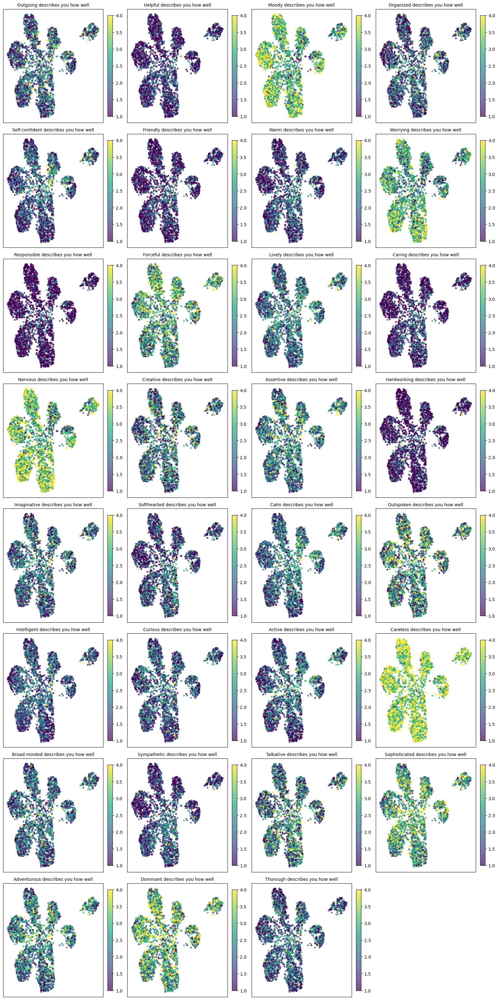

In [35]:
# 1. Load all necessary variables
all_vars = list(midus_vars.keys()) + list(personality_vars.keys())
df, meta = pyreadstat.read_sav(sav_path, usecols=all_vars)

# 2. Clean and separate training and mapping data
non_response_codes = [-1, -2, -3, -7, 9999]
df.replace(non_response_codes, pd.NA, inplace=True)

# Keep original index for later merge
df["orig_index"] = df.index

# Prepare UMAP training data
df_train = df[list(midus_vars.keys()) + ["orig_index"]].dropna().copy()
X_train = df_train.drop(columns=["orig_index"])

# 3. Scale and apply UMAP
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

umap_model = umap.UMAP(n_neighbors=30, min_dist=0.3, metric='euclidean', random_state=23)
embedding = umap_model.fit_transform(X_scaled)

# 4. UMAP DataFrame with index mapping
df_umapo = pd.DataFrame(embedding, columns=["UMAP1", "UMAP2"])
df_umapo["orig_index"] = df_train["orig_index"].values

# 5. Get personality variables for same rows
df_personality = df[["orig_index"] + list(personality_vars.keys())].set_index("orig_index")
df_personality.rename(columns=personality_vars, inplace=True)

# 6. Merge UMAP coordinates with personality values
df_augmented = df_umapo.merge(df_personality, left_on="orig_index", right_index=True, how="left")

# 7. Plot personality variables on UMAP
variables = list(personality_vars.values())
n_vars = len(variables)
n_cols = 4
n_rows = math.ceil(n_vars / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4 * n_cols, 4 * n_rows))
axes = axes.flatten()

for i, var in enumerate(variables):
    ax = axes[i]
    scatter = ax.scatter(df_augmented["UMAP1"], df_augmented["UMAP2"],
                         c=df_augmented[var], cmap='viridis', s=10, alpha=0.7)
    ax.set_title(var, fontsize=10)
    ax.set_xticks([])
    ax.set_yticks([])
    fig.colorbar(scatter, ax=ax, fraction=0.046, pad=0.04)

# Hide unused plots
for j in range(i + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.savefig('plots/personality_on_midus_umap.png', dpi=150)
